<a href="https://colab.research.google.com/github/kdambrowski/Data_science/blob/main/Computer_Vision.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [27]:
import cv2
import numpy as np
from google.colab.patches import cv2_imshow
from matplotlib import pyplot as plt
import urllib.request
from PIL import Image
import pandas as pd
from sklearn.cluster import KMeans
from sklearn import preprocessing
from sklearn.metrics import silhouette_score
import seaborn as sns
from imgaug import augmenters as iaa
import tensorflow
import imgaug.augmenters as iaa
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten
from tensorflow.keras.applications import EfficientNetB0
from keras.datasets import cifar100
from keras.models import Sequential
from keras.layers import UpSampling2D, GlobalAveragePooling2D, Dense, Dropout, BatchNormalization

In [28]:
def plot_history(history):
    #Plot the Loss Curves
    plt.figure(figsize=[8,6])

    plt.plot(history.history['loss'],'r',linewidth=3.0)
    plt.plot(history.history['val_loss'],'b',linewidth=3.0)
    
    plt.legend(['Training loss', 'Validation Loss'],fontsize=18)
    plt.xlabel('Epochs ',fontsize=16)
    plt.ylabel('Loss',fontsize=16)
    plt.title('Loss Curves',fontsize=16)
    plt.show()
    
    #Plot the Accuracy Curves
    plt.figure(figsize=[8,6])
    
    plt.plot(history.history['accuracy'], 'r', linewidth=3.0)
    plt.plot(history.history['val_accuracy'], 'b',linewidth=3.0)
    
    plt.legend(['Training Accuracy', 'Validation Accuracy'],fontsize=18)
    plt.xlabel('Epochs ',fontsize=16)
    plt.ylabel('Accuracy',fontsize=16)
    plt.title('Accuracy Curves',fontsize=16)
    plt.show()

class DataGenerator(tensorflow.keras.utils.Sequence):
    'Generates data for Keras'
    
    def __init__(self, images, labels, batch_size=64, shuffle=False, augment=False):
        self.labels = labels # array of labels
        self.images = images # array of images
        self.batch_size = batch_size # batch size
        self.shuffle = shuffle # shuffle bool
        self.augment = augment # augment data bool
        self.on_epoch_end()

    def __len__(self):
        'Denotes the number of batches per epoch'
        return int(np.floor(len(self.images) / self.batch_size))
        
    def on_epoch_end(self):
        'Updates indexes after each epoch'
        self.indexes = np.arange(len(self.images))
        if self.shuffle:
            np.random.shuffle(self.indexes)

    def __getitem__(self, index):
        'Generate one batch of data'

        # selects indices of data for next batch
        indexes = self.indexes[
            index * self.batch_size : (index + 1) * self.batch_size
        ]
        # index = 0 → 0:64, ie. 64 elements
        # index = 1 → 64:128, ie. 64 elements
        # index = 2 → 128:196, ie. 64 elements

        # select data and load images
        labels = np.array([self.labels[k] for k in indexes])
        images = np.array([self.images[k] for k in indexes])

        # preprocess and augment data
        # if self.augment == True:
        if self.augment:
            images = self.augmentor(images)
        
        # images=images / 255
        return images, labels

    def augmentor(self, images):
        'Apply data augmentation'

        def sometimes(aug):
            return iaa.Sometimes(0.5, aug)
            
        seq = iaa.Sequential(
            [sometimes(iaa.Crop(px=(1, 16), keep_size=True)),
             sometimes(iaa.Fliplr(0.5)),
             sometimes(iaa.GaussianBlur(sigma=(0, 3.0)))]
        )

        return seq.augment_images(images)

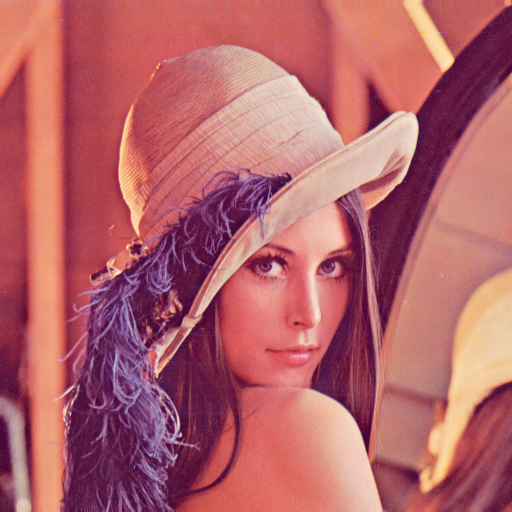

In [29]:
urllib.request.urlretrieve(
  'https://upload.wikimedia.org/wikipedia/en/7/7d/Lenna_%28test_image%29.png','Lenna_(test_image).png')
  
img = Image.open("Lenna_(test_image).png")
image = cv2.imread('/content/Lenna_(test_image).png')
cv2_imshow(image)

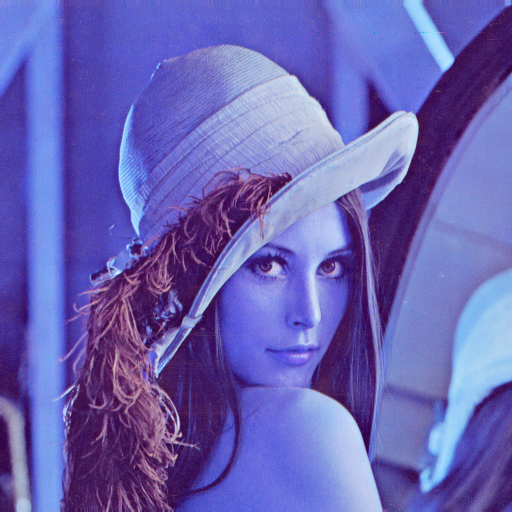

In [30]:
RGB_lena = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
cv2_imshow(RGB_lena)

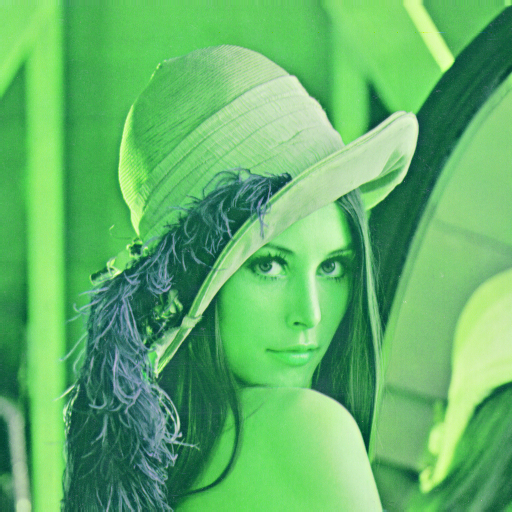

In [31]:
im_rgb = image[:, :, [2, 1, 0]]
im_rgb = image[:, :, [1, 0, 2]]
im_rgb = image[:, :, [2, 0, 1]]
im_rgb = image[:, :, [1, 2, 0]]
im_rgb = image[:, :, [0, 2, 1]]
cv2_imshow(im_rgb)

Augmented:


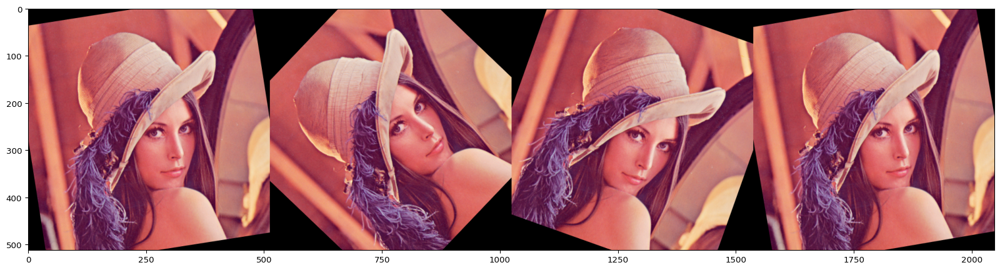

In [32]:
iaa.ia.seed(4)
images = [image, image, image, image]
images = [RGB_lena, RGB_lena, RGB_lena, RGB_lena]
rotate = iaa.Affine(rotate=(-50, 25))
image_aug = rotate(images=images)
print("Augmented:")
iaa.ia.imshow(np.hstack(image_aug))

Augmented:


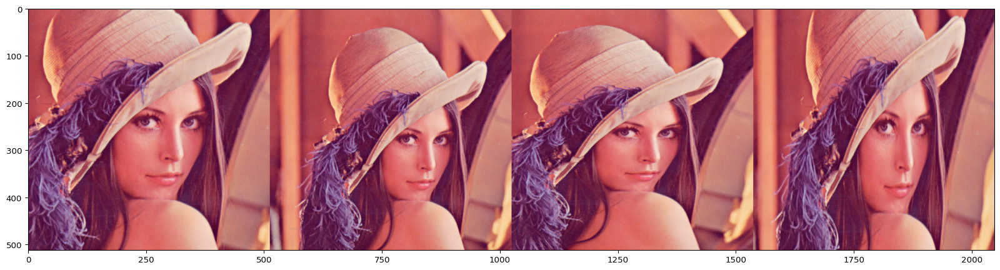

In [33]:
iaa.ia.seed(4)
images = [RGB_lena, RGB_lena, RGB_lena, RGB_lena]

zoomed = iaa.Crop(percent=(0, 0.2))
image_aug = zoomed(images=images)
print("Augmented:")
iaa.ia.imshow(np.hstack(image_aug))

Augmented:


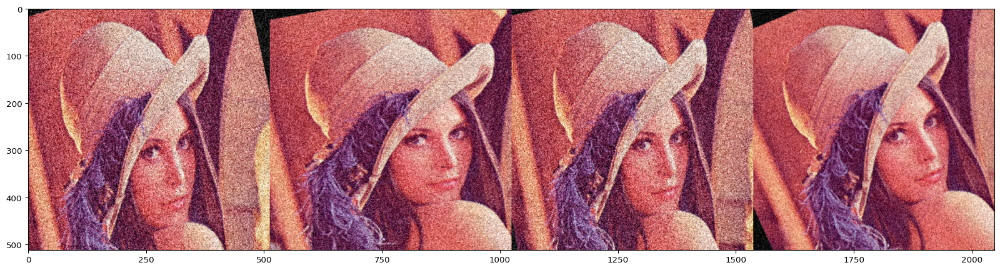

In [34]:

images = [RGB_lena, RGB_lena, RGB_lena, RGB_lena]
seq = iaa.Sequential([
    
 iaa.Affine(rotate=(-25, 25)),
 iaa.AdditiveGaussianNoise(scale=(10, 60)),
 iaa.Crop(percent=(0, 0.2))
])
images_aug = seq(images=images)
print("Augmented:")
iaa.ia.imshow(np.hstack(images_aug))

Augmented:


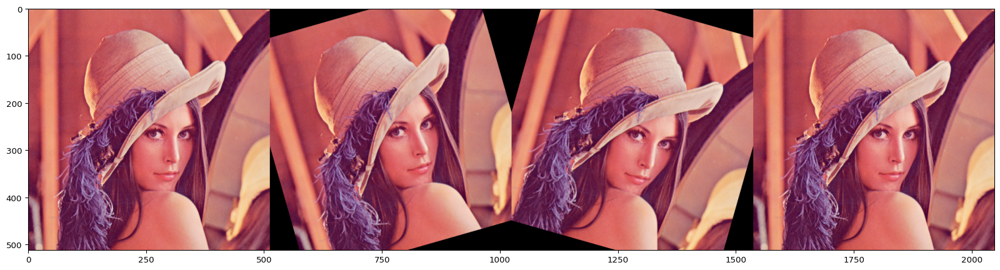

In [35]:
images = [RGB_lena, RGB_lena, RGB_lena, RGB_lena]

def sometimes(aug):
 return iaa.Sometimes(0.5, aug)

seq = iaa.Sequential([sometimes(
    iaa.Affine(rotate=(-25, 25))
)])
images_aug = seq (images=images )
print("Augmented:")
iaa.ia.imshow(np.hstack(images_aug))

Augmented:


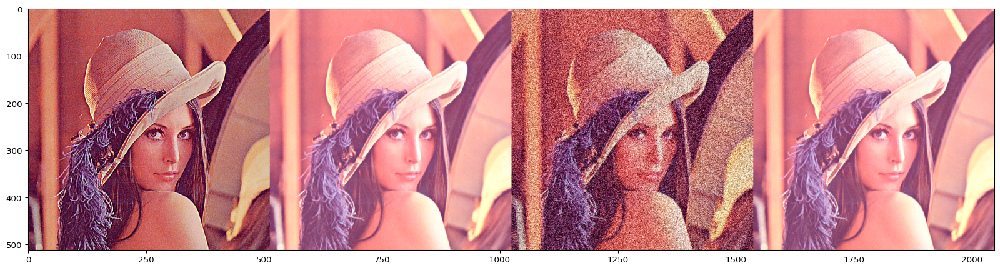

In [36]:
images = [RGB_lena, RGB_lena, RGB_lena, RGB_lena]
seq = iaa.OneOf([
 iaa.Affine(rotate=45),
 iaa.AdditiveGaussianNoise(scale=0.2*255),
 iaa.Add(50, per_channel=True),
 iaa.Sharpen(alpha=0.5)
])
images_aug = seq(images=images)
print("Augmented:")
iaa.ia.imshow(np.hstack(images_aug))

In [37]:
(train_x, train_y), (test_x, test_y) = tf.keras.datasets.cifar10.load_data()

print('Training data shape : ', train_x.shape, train_y.shape)
print('Testing data shape : ', test_x.shape, test_y.shape)



Training data shape :  (50000, 32, 32, 3) (50000, 1)
Testing data shape :  (10000, 32, 32, 3) (10000, 1)


In [38]:
train_x = train_x / 255
test_x = test_x / 255
train_y_one_hot = keras.utils.to_categorical(train_y)
test_y_one_hot = keras.utils.to_categorical(test_y)

In [39]:
model = Sequential()

model.add(Conv2D(32, 
                 (3, 3), 
                 activation='relu',
                 kernel_initializer='he_uniform',
                 padding='same',
                 input_shape=(32, 32, 3)
                 ))

model.add(Conv2D(32, 
                 (3, 3),
                 activation='relu',
                 kernel_initializer='he_uniform',
                 padding='same'
                 ))
model.add(MaxPooling2D((2, 2)))

# model.add(Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_uniform', padding='same'))

# model.add(Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_uniform', padding='same'))
# model.add(MaxPooling2D((2, 2)))

# model.add(Conv2D(128, (3, 3), activation='relu', kernel_initializer='he_uniform', padding='same'))

# model.add(Conv2D(128, (3, 3), activation='relu', kernel_initializer='he_uniform', padding='same'))
# model.add(MaxPooling2D((2, 2)))

model.add(Flatten())
model.add(Dense(64, activation='relu', kernel_initializer='he_uniform'))
model.add(Dense(10, activation='softmax'))

model.summary()

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_2 (Conv2D)           (None, 32, 32, 32)        896       
                                                                 
 conv2d_3 (Conv2D)           (None, 32, 32, 32)        9248      
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 16, 16, 32)       0         
 2D)                                                             
                                                                 
 flatten_1 (Flatten)         (None, 8192)              0         
                                                                 
 dense_4 (Dense)             (None, 64)                524352    
                                                                 
 dense_5 (Dense)             (None, 10)                650       
                                                      

In [40]:
opt = keras.optimizers.SGD(lr=0.001, momentum=0.9)
model.compile(
    optimizer=opt,
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

In [41]:
generator = DataGenerator(
    images=train_x,
    labels=train_y_one_hot,
    batch_size=64,
    shuffle=True,
    augment=True
)

In [42]:
history_with_augment = model.fit_generator(
    generator,
    epochs=25,
    verbose=True,
    validation_data=(test_x, test_y_one_hot),
)

Epoch 1/25


<ipython-input-42-e7254dd5e25c>:1: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  history_with_augment = model.fit_generator(


781/781 [==============================] - 187s 239ms/step - loss: 2.0135 - accuracy: 0.2627 - val_loss: 1.7383 - val_accuracy: 0.3963
Epoch 2/25
781/781 [==============================] - 183s 235ms/step - loss: 1.8572 - accuracy: 0.3277 - val_loss: 1.6796 - val_accuracy: 0.4002
Epoch 3/25
781/781 [==============================] - 184s 235ms/step - loss: 1.7809 - accuracy: 0.3556 - val_loss: 1.4929 - val_accuracy: 0.4719
Epoch 4/25
781/781 [==============================] - 182s 233ms/step - loss: 1.7253 - accuracy: 0.3755 - val_loss: 1.4423 - val_accuracy: 0.4839
Epoch 5/25
781/781 [==============================] - 188s 241ms/step - loss: 1.6866 - accuracy: 0.3952 - val_loss: 1.3729 - val_accuracy: 0.5139
Epoch 6/25
781/781 [==============================] - 183s 235ms/step - loss: 1.6434 - accuracy: 0.4087 - val_loss: 1.3534 - val_accuracy: 0.5118
Epoch 7/25
781/781 [==============================] - 185s 237ms/step - loss: 1.6157 - accuracy: 0.4207 - val_loss: 1.3207 - val_accura

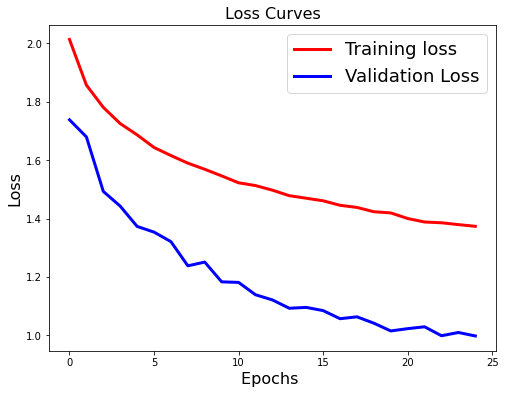

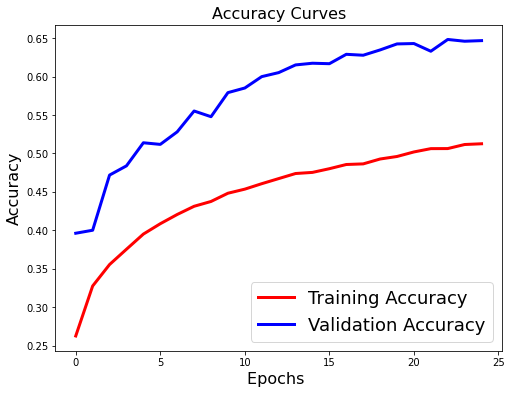

In [43]:
plot_history(history_with_augment)

In [44]:
(x_train, y_train), (x_test, y_test) = cifar100.load_data()

x_test = x_test/255
print(x_test.shape)

train_y_one_hot = keras.utils.to_categorical(y_train)
test_y_one_hot = keras.utils.to_categorical(y_test)

(10000, 32, 32, 3)


In [45]:
efficient_model = EfficientNetB0(
    weights='imagenet',
    include_top=False,
    input_shape=(32, 32, 3)
)

In [46]:
efficient_model.summary()

Model: "efficientnetb0"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_2 (InputLayer)           [(None, 32, 32, 3)]  0           []                               
                                                                                                  
 rescaling_1 (Rescaling)        (None, 32, 32, 3)    0           ['input_2[0][0]']                
                                                                                                  
 normalization_1 (Normalization  (None, 32, 32, 3)   7           ['rescaling_1[0][0]']            
 )                                                                                                
                                                                                                  
 tf.math.truediv_1 (TFOpLambda)  (None, 32, 32, 3)   0           ['normalization_1[0]

In [47]:
model = Sequential()

model.add(efficient_model)
model.add(GlobalAveragePooling2D())
model.add(Dense(256, activation='relu'))
model.add(Dropout(.25))
model.add(BatchNormalization())

num_classes = 100
model.add(Dense(num_classes, activation='softmax'))

for layer in efficient_model.layers:
    if isinstance(layer, BatchNormalization):
        layer.trainable = True
    else:
        layer.trainable = False

In [48]:
generator = DataGenerator(
    images=x_train,
    labels=train_y_one_hot,
    batch_size=64,
    shuffle=True,
    augment=True
)

es = keras.callbacks.EarlyStopping(
    monitor='val_loss',
    mode='min',
    verbose=1,
    patience=2
)

model.compile(
    optimizer='adam',
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

history = model.fit_generator(
    generator,
    epochs=50,
    verbose=True,
    validation_data=(x_test, test_y_one_hot),
    callbacks = [es]
)

<ipython-input-48-5e5968e51176>:22: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  history = model.fit_generator(


Epoch 1/50
781/781 [==============================] - 549s 689ms/step - loss: 4.3082 - accuracy: 0.0808 - val_loss: 4.7824 - val_accuracy: 0.0100
Epoch 2/50
781/781 [==============================] - 527s 675ms/step - loss: 3.6998 - accuracy: 0.1489 - val_loss: 4.8168 - val_accuracy: 0.0099
Epoch 3/50
781/781 [==============================] - 531s 680ms/step - loss: 3.4426 - accuracy: 0.1864 - val_loss: 4.8024 - val_accuracy: 0.0100
Epoch 3: early stopping
